In [3]:
%matplotlib inline

from PIL import Image
import numpy as np
import skimage.io as io
import tensorflow as tf
import keras
import cv2
import os
from sklearn.utils import shuffle

from sklearn.model_selection import train_test_split

Using TensorFlow backend.


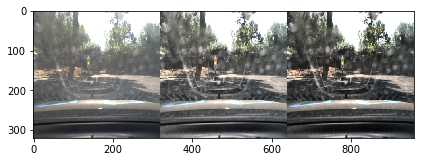

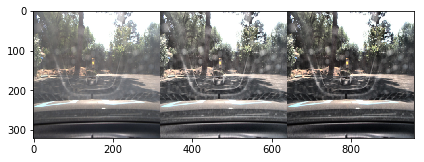

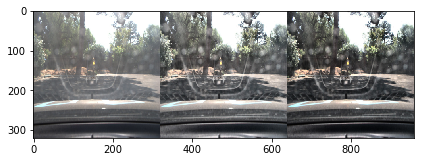

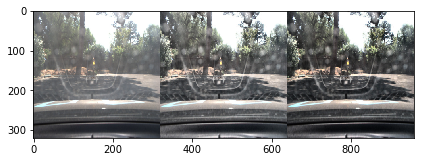

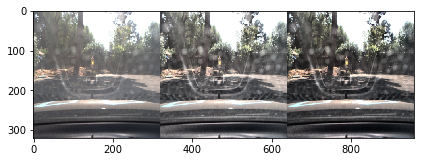

...

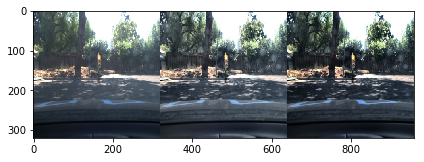

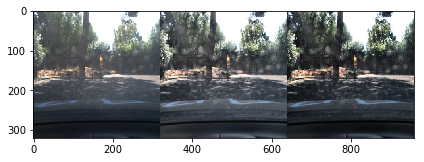

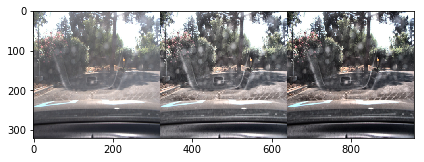

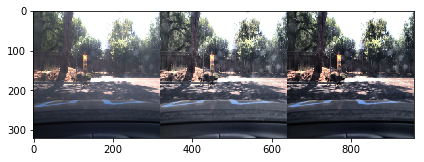

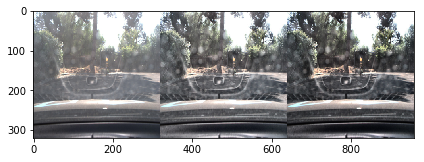

In [25]:
#from pylab import array, plot, show, axis, arange, figure, uint8 

#maxIntensity = 255.0 # depends on dtype of image data
#x = np.arange(maxIntensity) 

# Parameters for manipulating image data
#phi = 1
#theta = 1

# Decrease intensity such that
# dark pixels become much darker, 
# bright pixels become slightly dark 
#newImage1 = (maxIntensity/phi)*(image/(maxIntensity/theta))**2
#newImage1 = array(newImage1,dtype=uint8)
def adjust_gamma(image, gamma=1.0):
    # build a lookup table mapping the pixel values [0, 255] to
    # their adjusted gamma values
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
        # apply gamma correction using the lookup table
    return cv2.LUT(image, table)

img_shape = (320, 320, 3)
def load_images_from_folder(folder):
    images = []
    index = 0
    for filename in os.listdir(folder):
        if filename != '.DS_Store' and filename != 'simu':
            img = cv2.imread(os.path.join(folder,filename))
            if img.shape[0] >= 600 and img.shape[1] >= 800:
                img = cv2.resize(img, (img_shape[0], img_shape[1]), interpolation = cv2.INTER_AREA)
                #img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                #img = cv2.convertScaleAbs(img)
                clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
                img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)

                # equalize the histogram of the Y channel
                #img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])

                # convert the YUV image back to RGB format
                img_yuv[:,:,0] = clahe.apply(img_yuv[:,:,0])
                #equ = cv2.equalizeHist(img)
                img_clahe_output = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)
                
                # Gamma
                img_color = adjust_gamma(img, gamma=0.9)
                img_gamma = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)
                
                
                img_clahe_gamma_output = cv2.cvtColor(img_clahe_output, cv2.COLOR_RGB2BGR)
                img_clahe_gamma_output = adjust_gamma(img_clahe_gamma_output, gamma=0.75)
                img_clahe_gamma_output = cv2.cvtColor(img_clahe_gamma_output, cv2.COLOR_BGR2RGB)

                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                res = np.hstack((img, img_clahe_output, img_clahe_gamma_output)) #stacking images side-by-side
                if index < 20:
                    io.imshow(res)
                    io.show()
                #cv2.imwrite('res.png',res)
                index = index + 1
                #newImage0 = (maxIntensity/phi)*(img/(maxIntensity/theta))**0.5
                #newImage0 = array(newImage0,dtype=uint8)
                
                #newImage1 = (maxIntensity/phi)*(img/(maxIntensity/theta))**2
                #newImage1 = array(newImage1,dtype=uint8)
            #if img is not None:
                #images.append(np.array(img).reshape(img_shape[0], img_shape[1], img_shape[2]))
    return images

no_dir = 'images/0/'
red_dir = 'images/1/'
orange_dir = 'images/2/'
green_dir = 'images/3/'
simulator_subdir = 'simu'

orange_images = load_images_from_folder(orange_dir)
no_tl_images = load_images_from_folder(no_dir)
green_images = load_images_from_folder(green_dir)
red_images = load_images_from_folder(red_dir)

#orange_simu_images = load_images_from_folder(os.path.join(orange_dir, simulator_subdir))
#no_simu_images = load_images_from_folder(os.path.join(no_dir, simulator_subdir))
#green_simu_images = load_images_from_folder(os.path.join(green_dir, simulator_subdir))
#red_simu_images = load_images_from_folder(os.path.join(red_dir, simulator_subdir))

In [57]:
ora0 = cv2.cvtColor(orange_images[0], cv2.COLOR_BGR2RGB)
io.imshow(ora0)
io.show()

IndexError: list index out of range

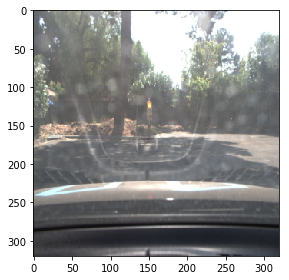

In [37]:
ora0 = cv2.cvtColor(red_images[0], cv2.COLOR_BGR2RGB)
io.imshow(ora0)
io.show()

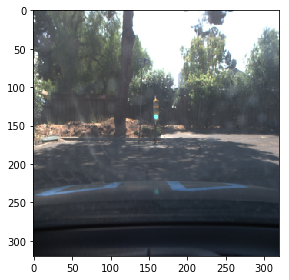

In [38]:
ora0 = cv2.cvtColor(green_images[0], cv2.COLOR_BGR2RGB)
io.imshow(ora0)
io.show()

In [39]:
# ora0 = cv2.cvtColor(orange_simu_images[0], cv2.COLOR_BGR2RGB)
# io.imshow(ora0)
# io.show()

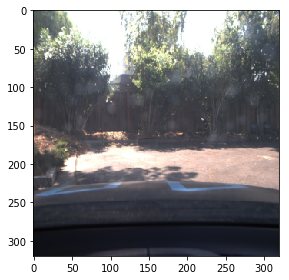

In [40]:
ora0 = cv2.cvtColor(no_tl_images[0], cv2.COLOR_BGR2RGB)
io.imshow(ora0)
io.show()

In [41]:
# ora0 = cv2.cvtColor(red_simu_images[0], cv2.COLOR_BGR2RGB)
# io.imshow(ora0)
# io.show()

In [42]:
# ora0 = cv2.cvtColor(green_simu_images[0], cv2.COLOR_BGR2RGB)
# io.imshow(ora0)
# io.show()

In [43]:
# ora0 = cv2.cvtColor(no_simu_images[0], cv2.COLOR_BGR2RGB)
# io.imshow(ora0)
# io.show()

In [44]:
print('Orange', len(orange_images))
print('Green', len(green_images))
print('No', len(no_tl_images))
print('Red', len(red_images))
print('TOTAL Unknown', len(orange_images) + len(green_images) + len(no_tl_images))
# print('Simu Orange', len(orange_simu_images))
# print('Simu Red', len(red_simu_images))
# print('Simu Green', len(green_simu_images))
# print('Simu None', len(no_simu_images))

Orange 200
Green 157
No 64
Red 267
TOTAL Unknown 421


In [45]:
orange_img_labels = np.zeros(len(orange_images)) * 2
no_tl_img_labels = np.zeros(len(no_tl_images))
green_img_labels = np.zeros(len(green_images)) * 3
red_img_labels = np.ones(len(red_images))

print('orange images', len(orange_images))
print('orange_img_labels', len(orange_img_labels))
print('no_tl_images', len(no_tl_images))
print('no_tl_img_labels', len(no_tl_img_labels))
print('green_images', len(green_images))
print('green_img_labels', len(green_img_labels))
print('red_images', len(red_images))
print('red_img_labels', len(red_img_labels))

images = orange_images + red_images + green_images + no_tl_images
labels = np.concatenate((orange_img_labels, red_img_labels, green_img_labels, no_tl_img_labels))

print('Total images', len(images))
print('Total labels', len(labels))

# orange__simu_img_labels = np.zeros(len(orange_simu_images)) * 2
# no_simu_img_labels = np.zeros(len(no_simu_images))
# green_simu_img_labels = np.zeros(len(green_simu_images)) * 3
# red_simu_img_labels = np.ones(len(red_simu_images))
# simu_images = orange_simu_images + red_simu_images + green_simu_images + no_simu_images
# simu_labels = np.concatenate((orange__simu_img_labels, red_simu_img_labels, green_simu_img_labels, no_simu_img_labels))

# print('Total simulator images', len(simu_images))
# print('Total simulator labels', len(simu_labels))

X_train, X_valid, y_train, y_valid = train_test_split(simu_images, simu_labels, test_size=0.10, random_state=42)

orange images 200
orange_img_labels 200
no_tl_images 64
no_tl_img_labels 64
green_images 157
green_img_labels 157
red_images 267
red_img_labels 267
Total images 688
Total labels 688


NameError: name 'simu_images' is not defined

In [ ]:
import h5py
from keras.models import Model, Sequential
from keras.layers import Input, Activation, Concatenate, Dense
from keras.layers import Flatten, Dropout, Reshape
from keras.layers import Convolution2D, MaxPooling2D, GlobalAveragePooling2D
from keras.layers import AveragePooling2D
import time

def print_time(t0, s):
    """Print how much time has been spent
    @param t0: previous timestamp
    @param s: description of this step
    """

    print("%.5f seconds to %s" % ((time.time() - t0), s))
    return time.time()

image_shape = img_shape
nb_classes = 2
def get_model():
  model = Sequential()
  model.add(Convolution2D(32, 3, 3, border_mode='same', input_shape=image_shape))
  model.add(Activation('relu'))
  model.add(Convolution2D(32, 3, 3))
  model.add(Activation('relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  model.add(Dropout(0.25))

  model.add(Convolution2D(64, 3, 3, border_mode='same'))
  model.add(Activation('relu'))
  model.add(Convolution2D(64, 3, 3))
  model.add(Activation('relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  model.add(Dropout(0.25))

  model.add(Flatten())
  model.add(Dense(512))
  model.add(Activation('relu'))
  model.add(Dropout(0.5))
  model.add(Dense(nb_classes))
  model.add(Activation('softmax'))

  # Let's train the model using RMSprop
#   model.compile(loss='categorical_crossentropy',
#               optimizer='rmsprop',
#               metrics=['accuracy'])
  return model

t0 = time.time()

model = get_model()
t0 = print_time(t0, 'build the model')

adam = keras.optimizers.Adam(lr=1e-4)
model.compile(
    optimizer=adam, loss='categorical_crossentropy',
    metrics=['accuracy'])
t0 = print_time(t0, 'compile model')

In [62]:
from keras.preprocessing.image import ImageDataGenerator

EPOCHS = 60
BATCH_SIZE = 16
dropout = 0.80 # Dropout, probability to keep units

X_train = np.array(X_train)
X_valid = np.array(X_valid)
print('X_train shape', X_train.shape)

datagen = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.05, 
    zoom_range=.1,
    horizontal_flip=True)

# compute quantities required for featurewise normalization
# (std, mean, and principal components if ZCA whitening is applied)
datagen.fit(X_train)

print('y_train shape', y_train.shape)
y_train1 = keras.utils.to_categorical(y_train, num_classes=4)
print('y_train shape', y_train1.shape)

# fits the model on batches with real-time data augmentation:
model.fit_generator(datagen.flow(X_train, 
                    keras.utils.to_categorical(y_train, num_classes=2), batch_size=BATCH_SIZE),
                    steps_per_epoch=len(X_train) / BATCH_SIZE, 
                    epochs=EPOCHS)
t0 = print_time(t0, 'train model')

model.save('classifier_model.h5')
t0 = print_time(t0, 'save model')

# datagen = ImageDataGenerator(width_shift_range=.2, height_shift_range=.2, shear_range=0.05, zoom_range=.1,
#                              fill_mode='nearest', rescale=1. / 255)
# image_data_gen = datagen.flow_from_directory('images', target_size=(64, 64), classes=['green', 'red', 'unknown'],
#                                              batch_size=batch_size)
# model.fit_generator(image_data_gen, nb_epoch=nb_epoch, samples_per_epoch=image_data_gen.nb_sample)

# model.save('light_classifier_model.h5')

X_train shape (1195, 224, 224, 3)
y_train shape (1195,)
y_train shape (1195, 4)
Epoch 1/60
75/74 [==============================] - 310s - loss: 1.0650 - acc: 0.5681   
Epoch 2/60
75/74 [==============================] - 298s - loss: 0.6426 - acc: 0.6217   
Epoch 3/60
75/74 [==============================] - 288s - loss: 0.6050 - acc: 0.6789   
Epoch 4/60
75/74 [==============================] - 262s - loss: 0.5974 - acc: 0.6677   
Epoch 5/60
75/74 [==============================] - 264s - loss: 0.5728 - acc: 0.6956   
Epoch 6/60
75/74 [==============================] - 289s - loss: 0.5470 - acc: 0.7109   
Epoch 7/60
75/74 [==============================] - 292s - loss: 0.5050 - acc: 0.7580   
Epoch 8/60
75/74 [==============================] - 306s - loss: 0.4640 - acc: 0.7763   
Epoch 9/60
75/74 [==============================] - 295s - loss: 0.4351 - acc: 0.7917   
Epoch 10/60
75/74 [==============================] - 271s - loss: 0.4230 - acc: 0.8205   
Epoch 11/60
75/74 [==========

In [ ]:
### Define your architecture here.

def SqueezeNet(nb_classes = 4, inputs=(img_shape[0], img_shape[1], img_shape[2])):
    """ Keras Implementation of SqueezeNet(arXiv 1602.07360)
    @param nb_classes: total number of final categories
    Arguments:
    inputs -- shape of the input images (channel, cols, rows)
    """

    input_img = Input(shape=inputs)
    conv1 = Convolution2D(
        64, (7, 7), activation='relu', kernel_initializer='glorot_uniform',
        strides=(2, 2), padding='same', name='conv1')(input_img)
    maxpool1 = MaxPooling2D(
        pool_size=(3, 3), strides=(2, 2), name='maxpool1')(conv1)
    fire2_squeeze = Convolution2D(
        16, (1, 1), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire2_squeeze')(maxpool1)
    fire2_expand1 = Convolution2D(
        64, (1, 1), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire2_expand1')(fire2_squeeze)
    fire2_expand2 = Convolution2D(
        64, (3, 3), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire2_expand2')(fire2_squeeze)
    merge2 = Concatenate(axis=1)([fire2_expand1, fire2_expand2])

    fire3_squeeze = Convolution2D(
        16, (1, 1), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire3_squeeze')(merge2)
    fire3_expand1 = Convolution2D(
        64, (1, 1), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire3_expand1')(fire3_squeeze)
    fire3_expand2 = Convolution2D(
        64, (3, 3), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire3_expand2')(fire3_squeeze)
    merge3 = Concatenate(axis=1)([fire3_expand1, fire3_expand2])

    fire4_squeeze = Convolution2D(
        32, (1, 1), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire4_squeeze')(merge3)
    fire4_expand1 = Convolution2D(
        128, (1, 1), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire4_expand1')(fire4_squeeze)
    fire4_expand2 = Convolution2D(
        128, (3, 3), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire4_expand2')(fire4_squeeze)
    merge4 = Concatenate(axis=1)([fire4_expand1, fire4_expand2])
    maxpool4 = MaxPooling2D(
        pool_size=(3, 3), strides=(2, 2), name='maxpool4')(merge4)

    fire5_squeeze = Convolution2D(
        32, (1, 1), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire5_squeeze')(maxpool4)
    fire5_expand1 = Convolution2D(
        128, (1, 1), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire5_expand1')(fire5_squeeze)
    fire5_expand2 = Convolution2D(
        128, (3, 3), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire5_expand2')(fire5_squeeze)
    merge5 = Concatenate(axis=1)([fire5_expand1, fire5_expand2])

    fire6_squeeze = Convolution2D(
        48, (1, 1), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire6_squeeze')(merge5)
    fire6_expand1 = Convolution2D(
        192, (1, 1), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire6_expand1')(fire6_squeeze)
    fire6_expand2 = Convolution2D(
        192, (3, 3), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire6_expand2')(fire6_squeeze)
    merge6 = Concatenate(axis=1)([fire6_expand1, fire6_expand2])

    fire7_squeeze = Convolution2D(
        48, (1, 1), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire7_squeeze')(merge6)
    fire7_expand1 = Convolution2D(
        192, (1, 1), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire7_expand1')(fire7_squeeze)
    fire7_expand2 = Convolution2D(
        192, (3, 3), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire7_expand2')(fire7_squeeze)
    merge7 = Concatenate(axis=1)([fire7_expand1, fire7_expand2])

    fire8_squeeze = Convolution2D(
        64, (1, 1), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire8_squeeze')(merge7)
    fire8_expand1 = Convolution2D(
        256, (1, 1), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire8_expand1')(fire8_squeeze)
    fire8_expand2 = Convolution2D(
        256, (3, 3), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire8_expand2')(fire8_squeeze)
    merge8 = Concatenate(axis=1)([fire8_expand1, fire8_expand2])

    maxpool8 = MaxPooling2D(
        pool_size=(3, 3), strides=(2, 2), name='maxpool8')(merge8)
    fire9_squeeze = Convolution2D(
        64, (1, 1), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire9_squeeze')(maxpool8)
    fire9_expand1 = Convolution2D(
        256, (1, 1), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire9_expand1')(fire9_squeeze)
    fire9_expand2 = Convolution2D(
        256, (3, 3), activation='relu', kernel_initializer='glorot_uniform',
        padding='same', name='fire9_expand2')(fire9_squeeze)
    merge9 = Concatenate(axis=1)([fire9_expand1, fire9_expand2])

    fire9_dropout = Dropout(0.5, name='fire9_dropout')(merge9)
    print(fire9_dropout)
    conv10 = Convolution2D(
        nb_classes, (1, 1), kernel_initializer='glorot_uniform',
        padding='valid', name='conv10')(fire9_dropout)
    print(conv10)
    x = Activation('relu', name='relu_conv10')(conv10)
    print(x)
    x = GlobalAveragePooling2D()(x)
    out = Activation('softmax', name='loss')(x)

    # The size should match the output of conv10
#     avgpool10 = AveragePooling2D(
#         (19, 19), name='avgpool10')(conv10)
#     print(avgpool10)
#     flatten = Flatten(name='flatten')(avgpool10)
#     print(flatten)
#     softmax = Activation("softmax", name='softmax')(flatten)
    print(out)
    return Model(inputs=input_img, outputs=out)
t0 = time.time()

model = SqueezeNet()
t0 = print_time(t0, 'build the model')

adam = keras.optimizers.Adam(lr=0.001)
model.compile(
    optimizer=adam, loss='categorical_crossentropy',
    metrics=['accuracy'])
t0 = print_time(t0, 'compile model')

In [ ]:
from keras.preprocessing.image import ImageDataGenerator

EPOCHS = 60
BATCH_SIZE = 32
dropout = 0.80 # Dropout, probability to keep units

X_train = np.array(X_train)
X_valid = np.array(X_valid)
print('X_train shape', X_train.shape)
#X_train = X_train.reshape(X_train.shape[0], 320, 320, 3)
#X_valid = X_valid.reshape(X_valid.shape[0], 320, 320, 3)
    
datagen = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True)

# compute quantities required for featurewise normalization
# (std, mean, and principal components if ZCA whitening is applied)
datagen.fit(X_train)

print('y_train shape', y_train.shape)
y_train1 = keras.utils.to_categorical(y_train, num_classes=4)
print('y_train shape', y_train1.shape)

# fits the model on batches with real-time data augmentation:
model.fit_generator(datagen.flow(X_train, 
                    keras.utils.to_categorical(y_train, num_classes=4), batch_size=BATCH_SIZE),
                    steps_per_epoch=len(X_train) / BATCH_SIZE, 
                    epochs=EPOCHS)
t0 = print_time(t0, 'train model')

model.save_weights('./weights.h5', overwrite=True)
t0 = print_time(t0, 'save model')

In [63]:
outputs = []
results = model.predict(
    X_valid, batch_size=1, verbose=1)


133/133 [==============================] - 16s    


NameError: name 'F' is not defined

In [74]:
classes = range(2)
correct = []
for i in range(0, len(y_valid)):
    _cls = results[i].argmax()
    #print(results[i])
    max_prob = results[i][_cls]
    outputs.append({'ground truth': y_valid[i], '_cls': _cls, 'class obtained': max_prob})
    correct.append(_cls == y_valid[i])
    #cls = [key for key in classes if classes[key] == _cls][0]
    #outputs[-1]['class'] = cls
    print('[squeezenet_demo] %s: %s' % (y_valid[i], _cls))
print('Correct ', correct)
print('TOTAL Correct ', np.sum(correct))
print('TOTAL', len(correct))
print('Accuracy', (np.sum(correct)/len(correct)))
t0 = print_time(t0, 'predict')

[squeezenet_demo] 0.0: 1
[squeezenet_demo] 0.0: 0
[squeezenet_demo] 0.0: 1
[squeezenet_demo] 1.0: 1
[squeezenet_demo] 0.0: 0
[squeezenet_demo] 1.0: 1
[squeezenet_demo] 0.0: 0
[squeezenet_demo] 1.0: 1
[squeezenet_demo] 1.0: 1
[squeezenet_demo] 1.0: 1
[squeezenet_demo] 0.0: 1
[squeezenet_demo] 1.0: 1
[squeezenet_demo] 0.0: 1
[squeezenet_demo] 0.0: 0
[squeezenet_demo] 0.0: 0
[squeezenet_demo] 1.0: 1
[squeezenet_demo] 1.0: 0
[squeezenet_demo] 0.0: 1
[squeezenet_demo] 0.0: 1
[squeezenet_demo] 1.0: 1
[squeezenet_demo] 1.0: 1
[squeezenet_demo] 0.0: 0
[squeezenet_demo] 0.0: 1
[squeezenet_demo] 0.0: 0
[squeezenet_demo] 0.0: 1
[squeezenet_demo] 0.0: 0
[squeezenet_demo] 1.0: 1
[squeezenet_demo] 1.0: 1
[squeezenet_demo] 0.0: 0
[squeezenet_demo] 0.0: 0
[squeezenet_demo] 0.0: 1
[squeezenet_demo] 1.0: 1
[squeezenet_demo] 1.0: 1
[squeezenet_demo] 1.0: 1
[squeezenet_demo] 0.0: 1
[squeezenet_demo] 1.0: 1
[squeezenet_demo] 0.0: 0
[squeezenet_demo] 1.0: 1
[squeezenet_demo] 1.0: 1
[squeezenet_demo] 1.0: 1
